In [1]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.applications.resnet_v2 import preprocess_input, decode_predictions
import numpy as np
import json
import shap
#import tensorflow as tf
from tensorflow.compat.v1.keras.backend import *
#import tensorflow.keras.backend as K
import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf
tf.compat.v1.disable_eager_execution()
from tensorflow import keras
import os
try:
    from urllib.request import urlretrieve
except ImportError:
    from urllib import urlretrieve
    
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import cv2
import os

In [11]:
data = []
# Ref: https://www.newbedev.com/python/howto/how-to-iterate-over-files-in-a-given-directory/
path = r'C:\Users\PaulDS3\Downloads\project\covid_cxr\data\Figure1-COVID-chestxray-dataset\images'
for filename in os.listdir(path):
    file = os.path.join(path, filename)
    #print(file)
    # Ref: Starting from Line 44 (https://www.pyimagesearch.com/2018/09/10/keras-tutorial-how-to-get-started-with-keras-deep-learning-and-python/)
    image = cv2.imread(file)
    image = cv2.resize(image, (224, 224)) # do not flatten. if you do then error input (224, 224, 3)
    data.append(image)
# scale the raw pixel intensities to the range [0, 1]
data = np.array(data, dtype="float") / 255.0

In [4]:
len(data)

55

In [5]:
data.shape

(55, 224, 224, 3)

In [6]:
# load pre-trained model and choose two images to explain
#model = VGG16(weights='imagenet', include_top=True)
model = keras.models.load_model('model20201109-115150.h5', compile=False)
#import tensorflow as tf
#from tensorflow import keras
print(tf.version.VERSION)
#model = create_model()
#model - keras.models.load_weights('model20201109-115150.h5')
#X,y = shap.datasets.imagenet50()
#to_explain = X[[39,41]]
#to_explain = X[[0]]
X = data
#to_explain = X[[0,3,5,10,45,54]]

2.3.1


In [7]:
# explain how the input to the 7th layer of the model explains the top two classes
def map2layer(x, layer):
    feed_dict = dict(zip([model.layers[0].input], [preprocess_input(x.copy())]))
    return K.get_session().run(model.layers[layer].input, feed_dict)

In [14]:
import pandas
df = pandas.read_csv('C:\\Users\\PaulDS3\\Downloads\\project\\covid_cxr\\results\\predictions\\20201113-214956\\predictions.csv')

In [37]:
df[['Image Filename','Predicted Class','p(non-COVID-19)','p(COVID-19)']].iloc[0]

Image Filename     COVID-00001.jpg
Predicted Class           COVID-19
p(non-COVID-19)        5.36034e-17
p(COVID-19)                      1
Name: 0, dtype: object

In [38]:
df[['Image Filename','Predicted Class','p(non-COVID-19)','p(COVID-19)']].iloc[0].values[:]

array(['COVID-00001.jpg', 'COVID-19', 5.3603355101355325e-17, 1.0],
      dtype=object)

In [39]:
df.sort_values(by=['Predicted Class','p(non-COVID-19)'], inplace=True, ascending=False)

In [40]:
df

,Image Filename,Predicted Class,p(non-COVID-19),p(COVID-19),Explanation Filename
33,COVID-00031.jpg,non-COVID-19,1.000000e+00,1.112053e-16,COVID-00031_exp_20201113-215627.jpg
19,COVID-00017.jpg,non-COVID-19,9.801306e-01,1.986943e-02,COVID-00017_exp_20201113-215346.jpg
53,COVID-00047.jpg,non-COVID-19,8.059616e-01,1.940384e-01,COVID-00047_exp_20201113-220018.jpg
49,COVID-00043b.jpg,COVID-19,5.354416e-02,9.464559e-01,COVID-00043b_exp_20201113-215933.jpg
11,COVID-00011.jpg,COVID-19,3.705517e-02,9.629448e-01,COVID-00011_exp_20201113-215215.jpg
50,COVID-00044.jpg,COVID-19,1.884273e-02,9.811572e-01,COVID-00044_exp_20201113-215944.jpg
47,COVID-00042.jpg,COVID-19,1.561129e-02,9.843887e-01,COVID-00042_exp_20201113-215910.jpg
22,COVID-00020.jpg,COVID-19,7.834158e-03,9.921658e-01,COVID-00020_exp_20201113-215419.jpg
10,COVID-00010.jpg,COVID-19,3.263467e-03,9.967365e-01,COVID-00010_exp_20201113-215204.jpg
30,COVID-00028.jpg,COVID-19,7.765616e-04,9.992235e-01,COVID-00028_exp_20201113-215552.jpg


Image Filename     COVID-00031.jpg
Predicted Class       non-COVID-19
p(non-COVID-19)                  1
p(COVID-19)            1.11205e-16
Name: 33, dtype: object


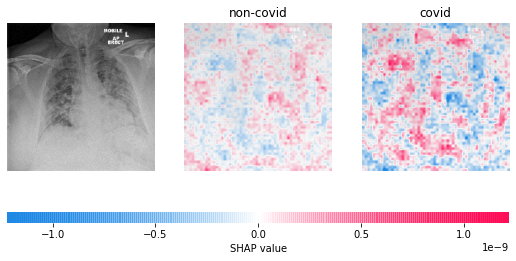

Image Filename     COVID-00017.jpg
Predicted Class       non-COVID-19
p(non-COVID-19)           0.980131
p(COVID-19)              0.0198694
Name: 19, dtype: object


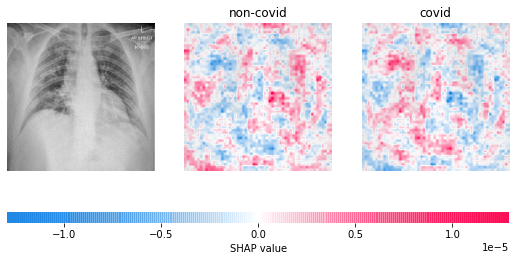

Image Filename     COVID-00047.jpg
Predicted Class       non-COVID-19
p(non-COVID-19)           0.805962
p(COVID-19)               0.194038
Name: 53, dtype: object


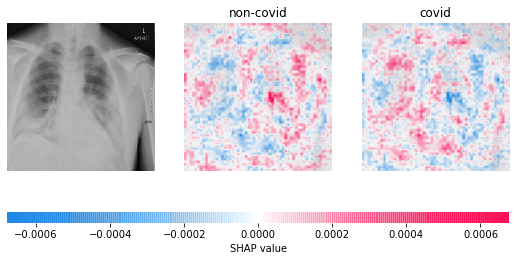

Image Filename     COVID-00043b.jpg
Predicted Class            COVID-19
p(non-COVID-19)           0.0535442
p(COVID-19)                0.946456
Name: 49, dtype: object


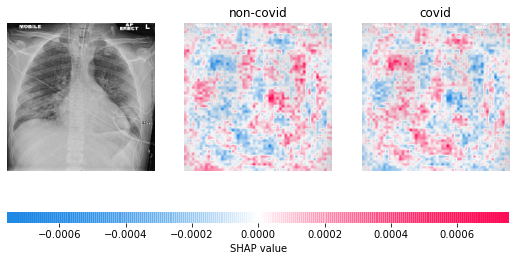

Image Filename     COVID-00011.jpg
Predicted Class           COVID-19
p(non-COVID-19)          0.0370552
p(COVID-19)               0.962945
Name: 11, dtype: object


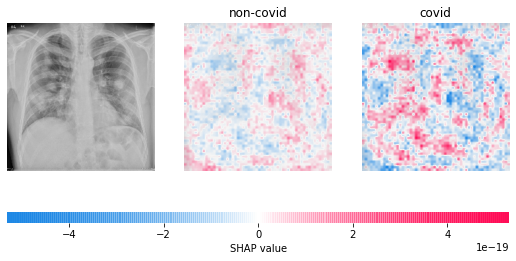

Image Filename     COVID-00044.jpg
Predicted Class           COVID-19
p(non-COVID-19)          0.0188427
p(COVID-19)               0.981157
Name: 50, dtype: object


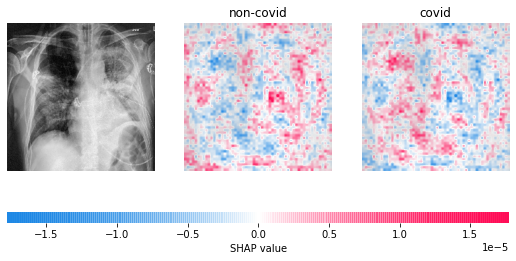

Image Filename     COVID-00042.jpg
Predicted Class           COVID-19
p(non-COVID-19)          0.0156113
p(COVID-19)               0.984389
Name: 47, dtype: object


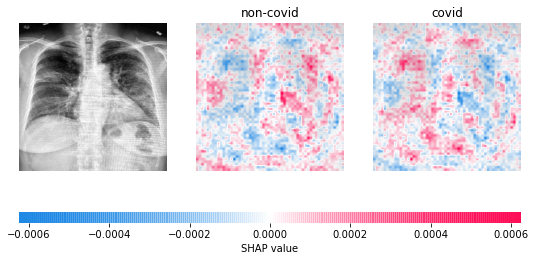

Image Filename     COVID-00020.jpg
Predicted Class           COVID-19
p(non-COVID-19)         0.00783416
p(COVID-19)               0.992166
Name: 22, dtype: object


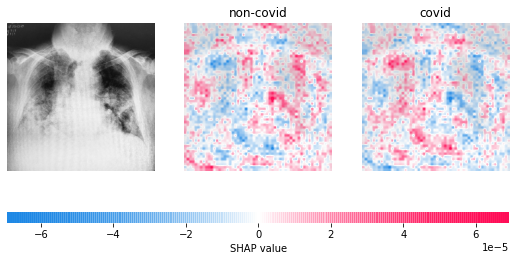

Image Filename     COVID-00010.jpg
Predicted Class           COVID-19
p(non-COVID-19)         0.00326347
p(COVID-19)               0.996736
Name: 10, dtype: object


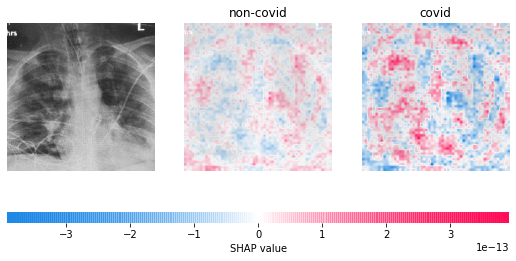

Image Filename     COVID-00028.jpg
Predicted Class           COVID-19
p(non-COVID-19)        0.000776562
p(COVID-19)               0.999223
Name: 30, dtype: object


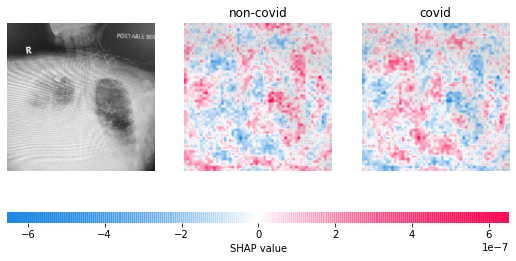

Image Filename     COVID-00040a.jpg
Predicted Class            COVID-19
p(non-COVID-19)         0.000338999
p(COVID-19)                0.999661
Name: 44, dtype: object


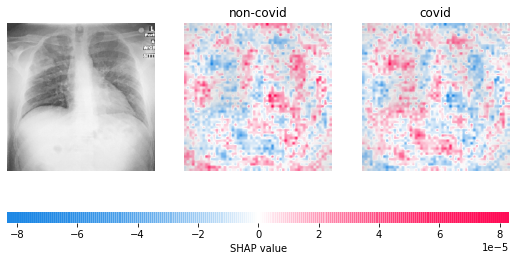

Image Filename     COVID-00007.jpg
Predicted Class           COVID-19
p(non-COVID-19)        0.000271785
p(COVID-19)               0.999728
Name: 7, dtype: object


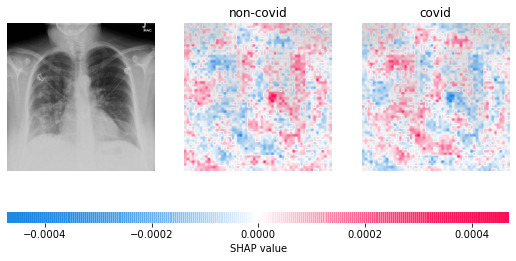

Image Filename     COVID-00040b.jpg
Predicted Class            COVID-19
p(non-COVID-19)         0.000170731
p(COVID-19)                0.999829
Name: 45, dtype: object


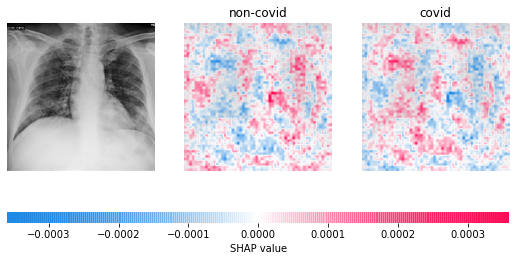

Image Filename     COVID-00023.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.01013e-05
p(COVID-19)                0.99999
Name: 25, dtype: object


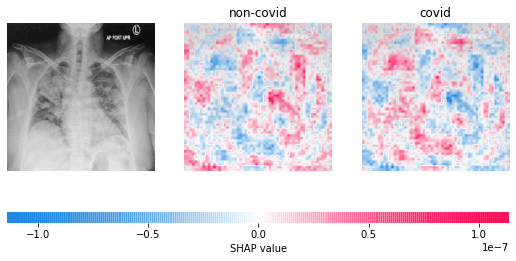

Image Filename     COVID-00035.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.53971e-06
p(COVID-19)               0.999997
Name: 37, dtype: object


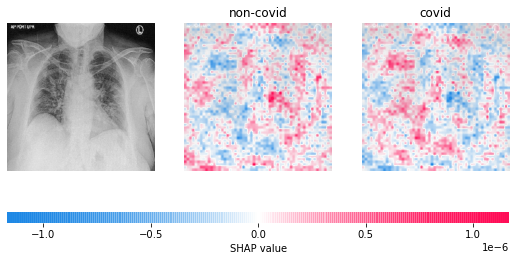

Image Filename     COVID-00012.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.61299e-06
p(COVID-19)               0.999998
Name: 12, dtype: object


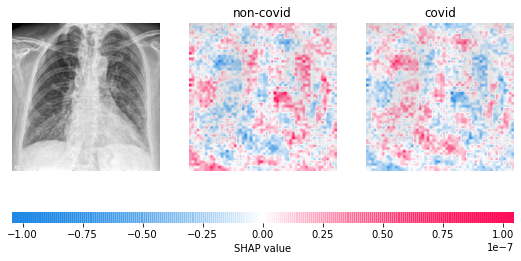

Image Filename     COVID-00041.jpg
Predicted Class           COVID-19
p(non-COVID-19)        7.23247e-07
p(COVID-19)               0.999999
Name: 46, dtype: object


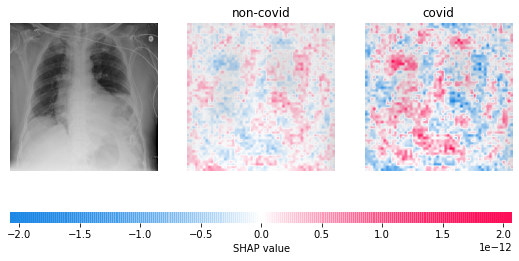

Image Filename     COVID-00019.jpg
Predicted Class           COVID-19
p(non-COVID-19)        4.39081e-07
p(COVID-19)                      1
Name: 21, dtype: object


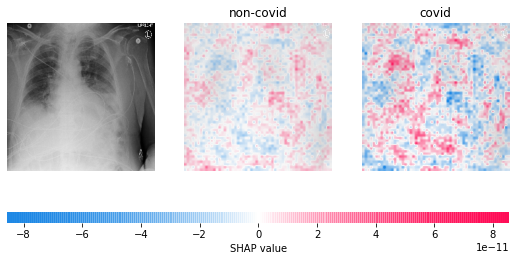

Image Filename     COVID-00048.png
Predicted Class           COVID-19
p(non-COVID-19)        2.04253e-07
p(COVID-19)                      1
Name: 54, dtype: object


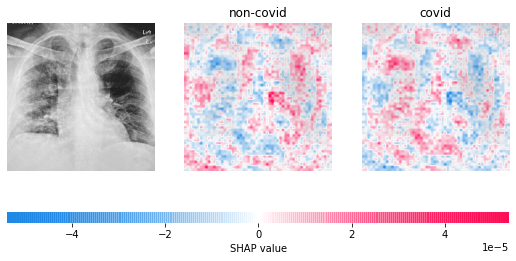

Image Filename     COVID-00034.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.73561e-07
p(COVID-19)                      1
Name: 36, dtype: object


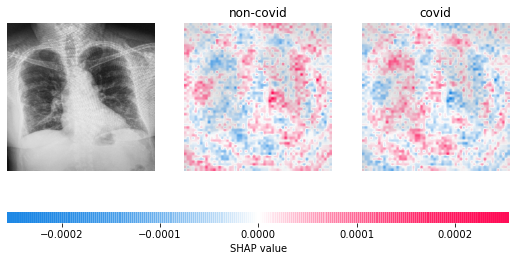

Image Filename     COVID-00022.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.55335e-07
p(COVID-19)                      1
Name: 24, dtype: object


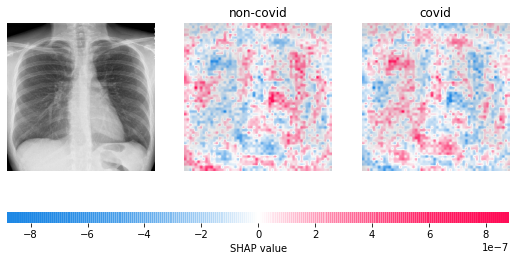

Image Filename     COVID-00005.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.44411e-08
p(COVID-19)                      1
Name: 5, dtype: object


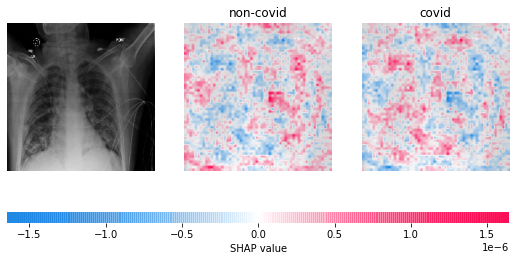

Image Filename     COVID-00014.jpg
Predicted Class           COVID-19
p(non-COVID-19)        8.09812e-09
p(COVID-19)                      1
Name: 15, dtype: object


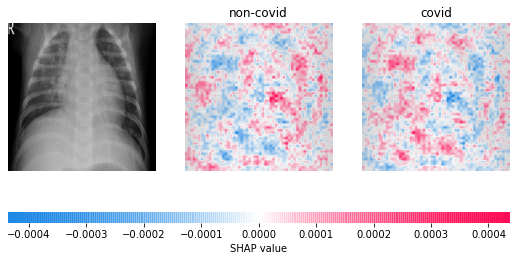

Image Filename     COVID-00033.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.33885e-09
p(COVID-19)                      1
Name: 35, dtype: object


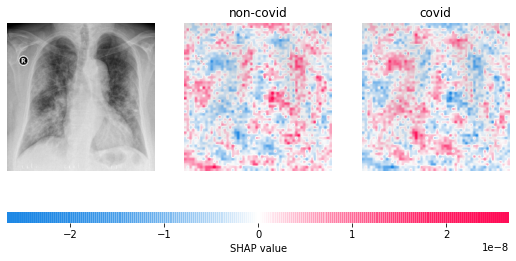

Image Filename     COVID-00037.jpg
Predicted Class           COVID-19
p(non-COVID-19)        3.78954e-10
p(COVID-19)                      1
Name: 39, dtype: object


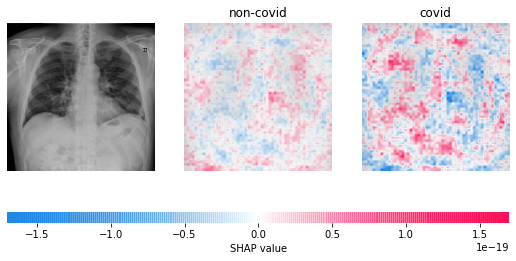

Image Filename     COVID-00013b.jpg
Predicted Class            COVID-19
p(non-COVID-19)          3.6613e-10
p(COVID-19)                       1
Name: 14, dtype: object


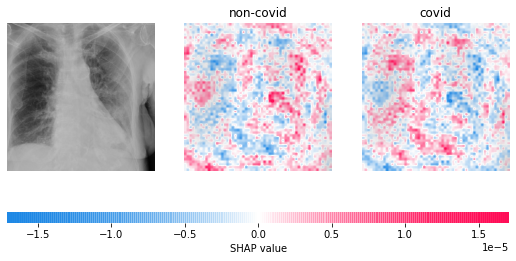

Image Filename     COVID-00021.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.73399e-10
p(COVID-19)                      1
Name: 23, dtype: object


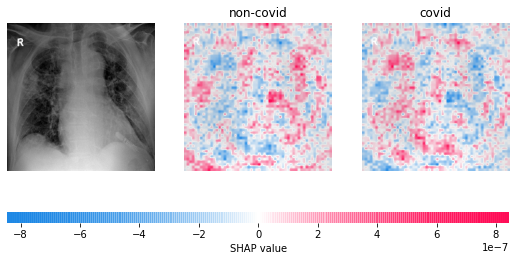

Image Filename     COVID-00015b.png
Predicted Class            COVID-19
p(non-COVID-19)         2.14834e-10
p(COVID-19)                       1
Name: 17, dtype: object


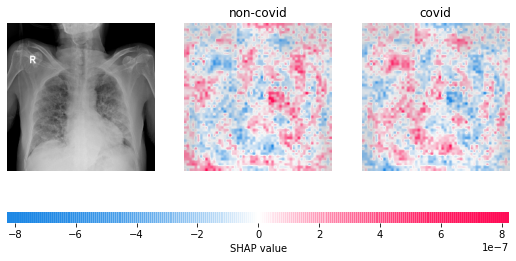

Image Filename     COVID-00002.jpg
Predicted Class           COVID-19
p(non-COVID-19)        9.24479e-11
p(COVID-19)                      1
Name: 1, dtype: object


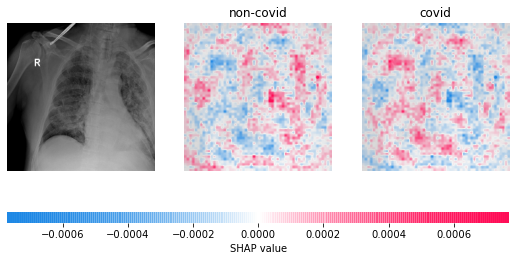

Image Filename     COVID-00003a.jpg
Predicted Class            COVID-19
p(non-COVID-19)         4.39398e-11
p(COVID-19)                       1
Name: 2, dtype: object


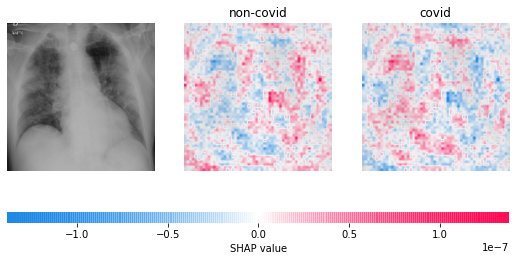

Image Filename     COVID-00015a.png
Predicted Class            COVID-19
p(non-COVID-19)         1.36364e-11
p(COVID-19)                       1
Name: 16, dtype: object


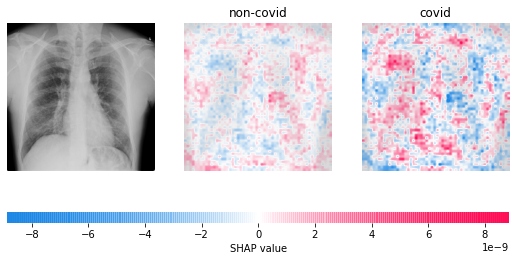

Image Filename     COVID-00013a.jpg
Predicted Class            COVID-19
p(non-COVID-19)         9.07809e-12
p(COVID-19)                       1
Name: 13, dtype: object


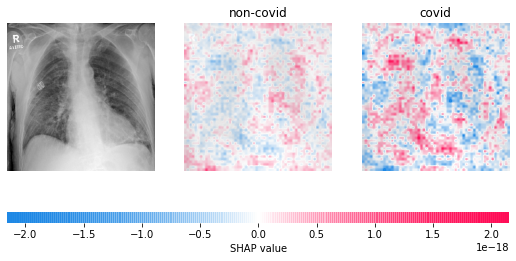

Image Filename     COVID-00045.png
Predicted Class           COVID-19
p(non-COVID-19)        6.91723e-12
p(COVID-19)                      1
Name: 51, dtype: object


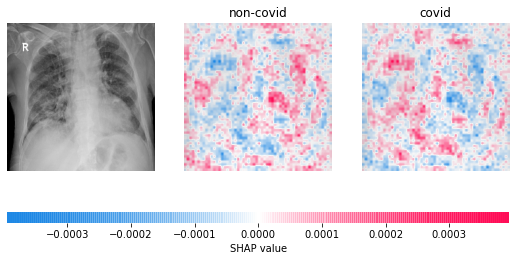

Image Filename     COVID-00024.jpg
Predicted Class           COVID-19
p(non-COVID-19)        7.83923e-13
p(COVID-19)                      1
Name: 26, dtype: object


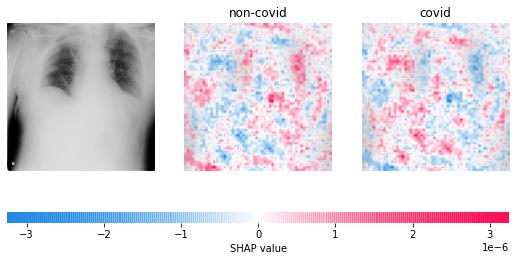

Image Filename     COVID-00003b.jpg
Predicted Class            COVID-19
p(non-COVID-19)          7.7396e-13
p(COVID-19)                       1
Name: 3, dtype: object


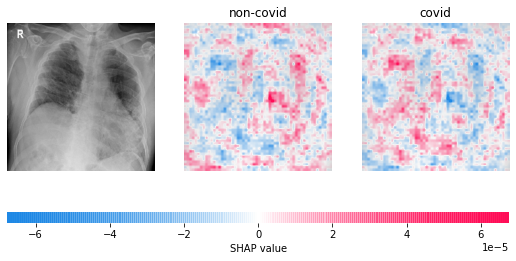

Image Filename     COVID-00027.jpg
Predicted Class           COVID-19
p(non-COVID-19)        5.44297e-13
p(COVID-19)                      1
Name: 29, dtype: object


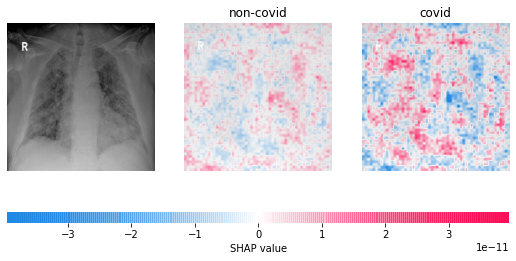

Image Filename     COVID-00018.jpg
Predicted Class           COVID-19
p(non-COVID-19)        3.44069e-13
p(COVID-19)                      1
Name: 20, dtype: object


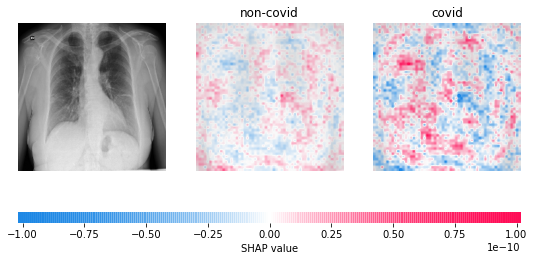

Image Filename     COVID-00030.jpg
Predicted Class           COVID-19
p(non-COVID-19)        8.40742e-14
p(COVID-19)                      1
Name: 32, dtype: object


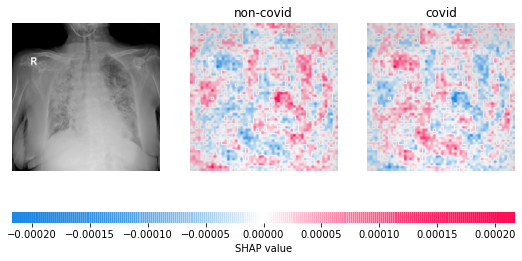

Image Filename     COVID-00026.jpg
Predicted Class           COVID-19
p(non-COVID-19)        3.62871e-14
p(COVID-19)                      1
Name: 28, dtype: object


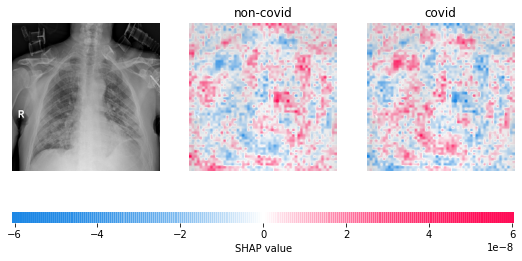

Image Filename     COVID-00032.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.97549e-14
p(COVID-19)                      1
Name: 34, dtype: object


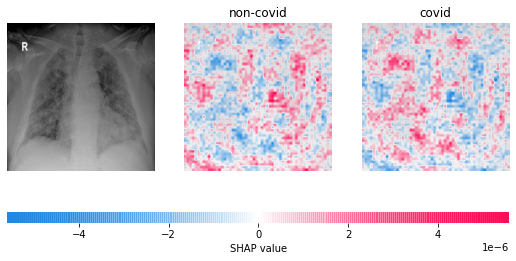

Image Filename     COVID-00029.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.99186e-14
p(COVID-19)                      1
Name: 31, dtype: object


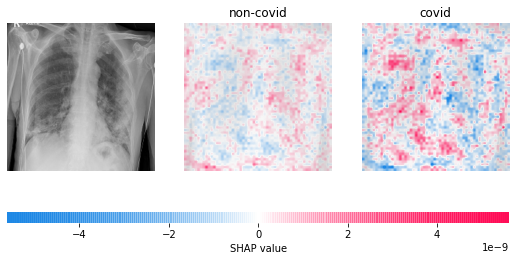

Image Filename     COVID-00025.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.60463e-14
p(COVID-19)                      1
Name: 27, dtype: object


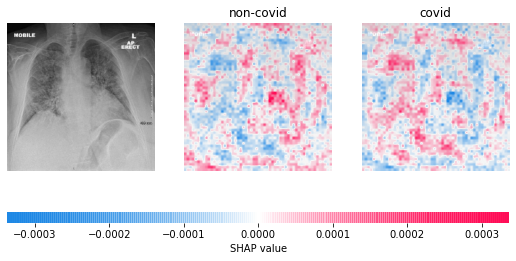

Image Filename     COVID-00006.jpg
Predicted Class           COVID-19
p(non-COVID-19)        7.95738e-15
p(COVID-19)                      1
Name: 6, dtype: object


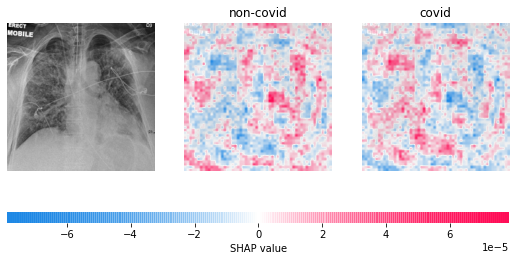

Image Filename     COVID-00016.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.16824e-15
p(COVID-19)                      1
Name: 18, dtype: object


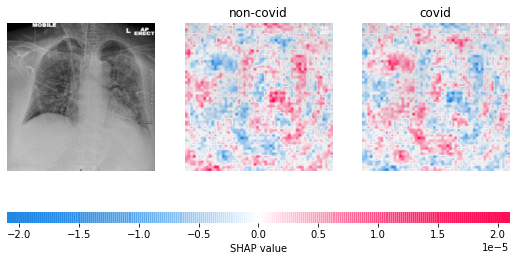

Image Filename     COVID-00039b.jpg
Predicted Class            COVID-19
p(non-COVID-19)         1.44068e-15
p(COVID-19)                       1
Name: 42, dtype: object


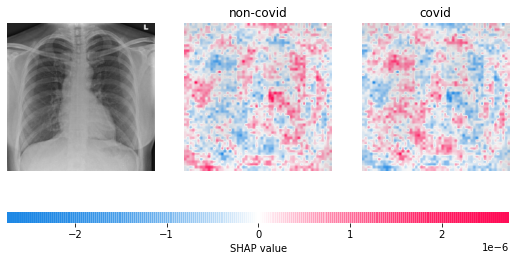

Image Filename     COVID-00043a.jpg
Predicted Class            COVID-19
p(non-COVID-19)         7.65739e-16
p(COVID-19)                       1
Name: 48, dtype: object


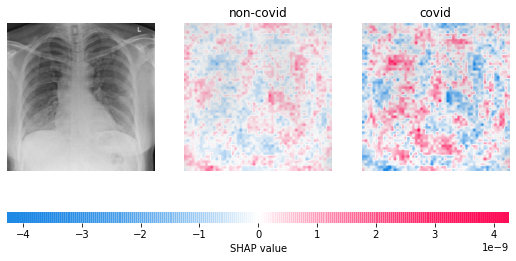

Image Filename     COVID-00004.jpg
Predicted Class           COVID-19
p(non-COVID-19)        3.00288e-16
p(COVID-19)                      1
Name: 4, dtype: object


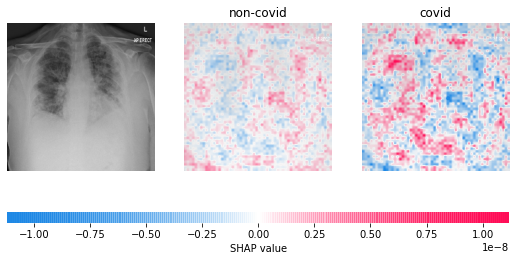

Image Filename     COVID-00001.jpg
Predicted Class           COVID-19
p(non-COVID-19)        5.36034e-17
p(COVID-19)                      1
Name: 0, dtype: object


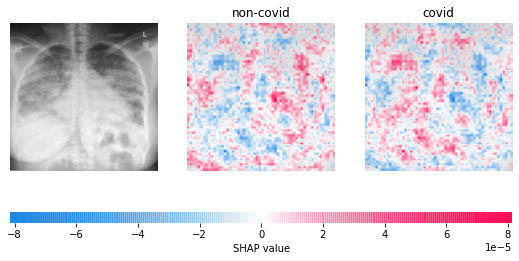

Image Filename     COVID-00039c.jpg
Predicted Class            COVID-19
p(non-COVID-19)         5.28519e-18
p(COVID-19)                       1
Name: 43, dtype: object


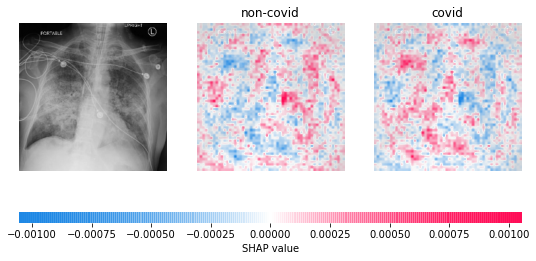

Image Filename     COVID-00009.jpg
Predicted Class           COVID-19
p(non-COVID-19)        1.07289e-18
p(COVID-19)                      1
Name: 9, dtype: object


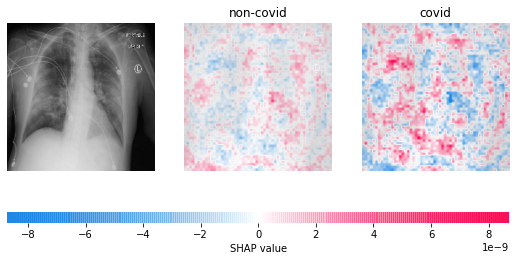

Image Filename     COVID-00038.jpg
Predicted Class           COVID-19
p(non-COVID-19)        3.82423e-19
p(COVID-19)                      1
Name: 40, dtype: object


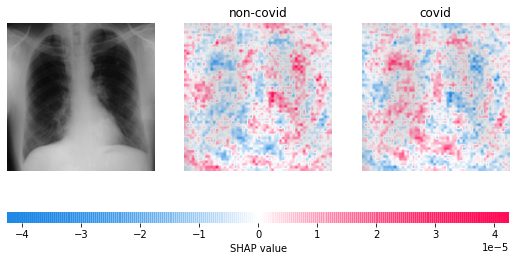

Image Filename     COVID-00039a.jpg
Predicted Class            COVID-19
p(non-COVID-19)         3.89351e-20
p(COVID-19)                       1
Name: 41, dtype: object


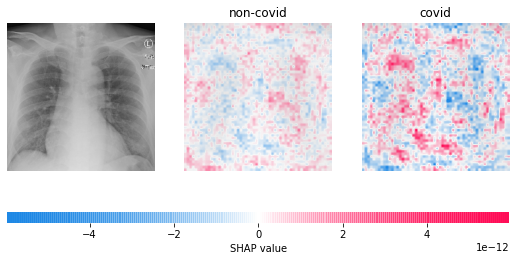

Image Filename     COVID-00036.jpg
Predicted Class           COVID-19
p(non-COVID-19)        2.44993e-23
p(COVID-19)                      1
Name: 38, dtype: object


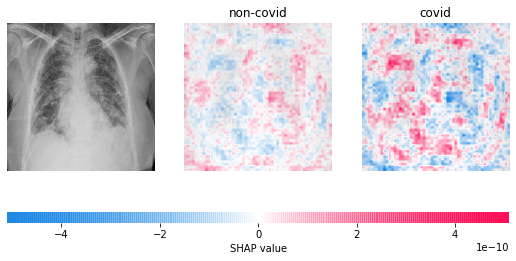

Image Filename     COVID-00046.png
Predicted Class           COVID-19
p(non-COVID-19)        7.16788e-26
p(COVID-19)                      1
Name: 52, dtype: object


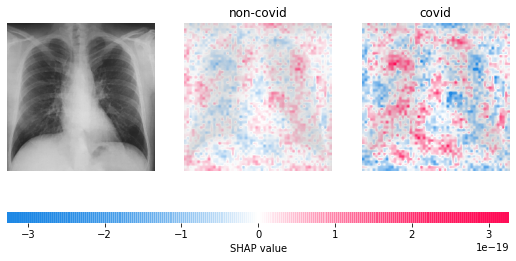

Image Filename     COVID-00008.jpg
Predicted Class           COVID-19
p(non-COVID-19)        7.36251e-33
p(COVID-19)                      1
Name: 8, dtype: object


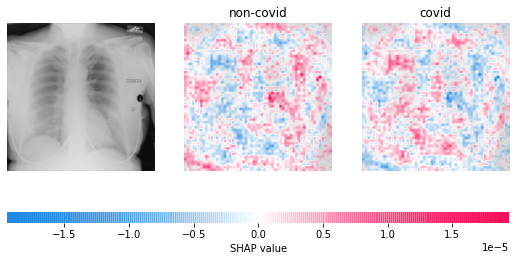

In [41]:
# layer i
i = 24 # For DCNN-RESNET ONLY do not 10, 11, 12, 13 caused plot to crash {'list' object has no attribute 'sum'}, 19, 20, 21, 26, 27
for idx in range(len(data)):
    to_explain = X[[idx]]
    e = shap.GradientExplainer((model.layers[i].input, model.layers[-1].output), map2layer(preprocess_input(X.copy()), i), local_smoothing=100)
    shap_values,indexes = e.shap_values(map2layer(to_explain, i), ranked_outputs=2)
    print(df[['Image Filename','Predicted Class','p(non-COVID-19)','p(COVID-19)']].iloc[idx])
    # plot the explanations
    shap.image_plot(shap_values, to_explain, [['non-covid', 'covid']]) # replaced index_names with [['non-covid', 'covid']]